In [2]:
import folium
from shapely.geometry import Polygon
import geopandas as gpd

# Sample dataset
data = """DBA,TECHNOLOGY,geometry
T-Mobile,83,"POLYGON ((-89.080537 35.020004, -89.080537 35.019269, -89.082333 35.019269, -89.082333 35.020004, -89.080537 35.020004))"
T-Mobile,83,"POLYGON ((-89.023943 35.075897, -89.023943 35.074426, -89.024841 35.074426, -89.024841 35.075897, -89.023943 35.075897))"
T-Mobile,83,"POLYGON ((-89.031129 35.011176, -89.031129 35.009704, -89.032028 35.009704, -89.032028 35.011176, -89.031129 35.011176))"
T-Mobile,83,"POLYGON ((-89.032926 35.000139, -89.032926 34.999403, -89.034723 34.999403, -89.034723 35.000139, -89.032926 35.000139))"
T-Mobile,83,"POLYGON ((-89.032926 34.948613, -89.032926 34.94714, -89.033824 34.94714, -89.033824 34.948613, -89.032926 34.948613))"
T-Mobile,83,"POLYGON ((-89.277268 35.226468, -89.277268 35.225, -89.278166 35.225, -89.278166 35.226468, -89.277268 35.226468))"""

# Convert the data to a GeoDataFrame
gdf = gpd.read_file(gpd.GeoDataFrame.from_features([{
    'geometry': Polygon(line.split(',')[2].strip('"\n')),
    'DBA': line.split(',')[0],
    'TECHNOLOGY': int(line.split(',')[1])
} for line in data.split('\n')[1:-1]]).to_json())

# Create a Folium map centered around the first polygon
m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=10)

# Add markers for each polygon
for idx, row in gdf.iterrows():
    folium.Marker(location=[row.geometry.centroid.y, row.geometry.centroid.x],
                  popup=f"{row['DBA']} - Technology {row['TECHNOLOGY']}",
                  icon=folium.Icon(color='blue')).add_to(m)

# Display the map
m.save('map.html')  # Save the map to an HTML file

ValueError: could not convert string to float: 'P'

In [9]:
import pandas as pd

df = pd.read_csv('./data/data_test_Tmobile_voice.csv')

In [10]:
df.head()

,DBA,TECHNOLOGY,geometry
0,T-Mobile,83,"POLYGON ((-89.080537 35.020004, -89.080537 35...."
1,T-Mobile,83,"POLYGON ((-89.023943 35.075897, -89.023943 35...."
2,T-Mobile,83,"POLYGON ((-89.031129 35.011176, -89.031129 35...."
3,T-Mobile,83,"POLYGON ((-89.032926 35.000139, -89.032926 34...."
4,T-Mobile,83,"POLYGON ((-89.032926 34.948613, -89.032926 34...."


In [13]:
df['x1'] = df['geometry'].apply(lambda x: x.split(')')[-1].split(')')[0].split(',')[0].split(' ')[0])

In [14]:
gpd.read_file()

,DBA,TECHNOLOGY,geometry,x1
0,T-Mobile,83,"POLYGON ((-89.080537 35.020004, -89.080537 35....",
1,T-Mobile,83,"POLYGON ((-89.023943 35.075897, -89.023943 35....",
2,T-Mobile,83,"POLYGON ((-89.031129 35.011176, -89.031129 35....",
3,T-Mobile,83,"POLYGON ((-89.032926 35.000139, -89.032926 34....",
4,T-Mobile,83,"POLYGON ((-89.032926 34.948613, -89.032926 34....",


In [7]:
# Create a Folium map centered around the first polygon
m = folium.Map(location=[df['geometry'].apply(lambda x: pd.eval(x).centroid.y).mean(),
                         df['geometry'].apply(lambda x: pd.eval(x).centroid.x).mean()],
               zoom_start=10)

# Add markers for each polygon
for _, row in df.sample(1000).iterrows():
    polygon = pd.eval(row['geometry'])
    centroid = polygon.centroid

    folium.Marker(location=[centroid.y, centroid.x],
                  popup=f"{row['DBA']} - Technology {row['TECHNOLOGY']}",
                  icon=folium.Icon(color='blue')).add_to(m)

# Display the map

SyntaxError: invalid syntax. Perhaps you forgot a comma? (<unknown>, line 1)

In [5]:
import geopandas as gpd
import geodatasets
import folium
import matplotlib.pyplot as plt

(150000, 3)

In [15]:
# path = geodatasets.get_path("nybb")
gdf = gpd.read_file('./data/data_test_Tmobile_voice.csv', GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO")
gdf.head()

,DBA,TECHNOLOGY,geometry
0,T-Mobile,83,"POLYGON ((-89.08054 35.02000, -89.08054 35.019..."
1,T-Mobile,83,"POLYGON ((-89.02394 35.07590, -89.02394 35.074..."
2,T-Mobile,83,"POLYGON ((-89.03113 35.01118, -89.03113 35.009..."
3,T-Mobile,83,"POLYGON ((-89.03293 35.00014, -89.03293 34.999..."
4,T-Mobile,83,"POLYGON ((-89.03293 34.94861, -89.03293 34.947..."


In [18]:
from shapely import wkt
gdf['geometry_'] = gdf['geometry'].apply(wkt.loads)
gdf1 = gpd.GeoDataFrame(gdf, geometry = 'geometry_')

TypeError: Expected bytes or string, got Polygon

NameError: name 'plt' is not defined

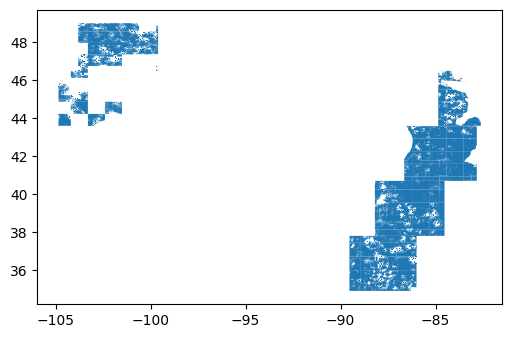

In [19]:
gdf.plot(figsize=(6, 6))
plt.show()

In [21]:
print(gdf.crs)

None


In [20]:
gdf = gdf.to_crs(epsg=4326)
print(gdf.crs)
gdf.head()

ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

In [28]:
sample_gdf = gdf.sample(10000)
m = folium.Map(location=[40.70, -73.94], zoom_start=10, tiles='CartoDB positron')

for _, r in sample_gdf.iterrows():
    #without simplifying the representation of each borough, the map might not be displayed
    #sim_geo = gpd.GeoSeries(r['geometry'])
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j)
                        #    style_function=lambda x: {'fillColor': 'orange'})
    # folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(m)
m

In [31]:
gdf['lat'] = gdf.centroid.y
gdf['lon'] = gdf.centroid.x

In [32]:
gdf.head()

,DBA,TECHNOLOGY,geometry,lat,lon
0,T-Mobile,83,"POLYGON ((-89.08054 35.02000, -89.08054 35.019...",35.019637,-89.081435
1,T-Mobile,83,"POLYGON ((-89.02394 35.07590, -89.02394 35.074...",35.075162,-89.024392
2,T-Mobile,83,"POLYGON ((-89.03113 35.01118, -89.03113 35.009...",35.010440,-89.031579
3,T-Mobile,83,"POLYGON ((-89.03293 35.00014, -89.03293 34.999...",34.999771,-89.033824
4,T-Mobile,83,"POLYGON ((-89.03293 34.94861, -89.03293 34.947...",34.947877,-89.033375
